# Исследование рынка заведений общественного питания Москвы

## Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят нас подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках.

## План работы

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import plotly.express as px 

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv') 
display(df.head())
df.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [3]:
print('Количество заведений:', df.name.nunique())

Количество заведений: 5614


In [4]:
df.duplicated().sum()

0

In [5]:
# проверим категориальные данные на содержание неявных дубликатов
display(df['category'].unique())
display(df['district'].unique())
df['price'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [6]:
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()

In [7]:
print('Неявных дубликатов:', df.loc[:, ['name', 'address']].duplicated().sum())

Неявных дубликатов: 4


In [8]:
df = df.drop_duplicates(subset=['name', 'address'])  # удалим дубликаты

Мы имеем датафрейм с 8406 точками общественного питания Москвы. Сетевых и не сетевых. Если считать не точки, а предприятия, то в датафрейме 5614 предприятий. Полных дубликатов нет. Все столбцы с текстом, такие как названия заведений, их тип, адрес, район, время работы имеют тип данных object, а столбцы с числовыми данными - float.     

In [9]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

По причине большого количества пропусков мы не можем от них избавиться, так мы потеряем очень много данных.

Создадим столбец street с названиями улиц из столбца с адресом. Для этого создадим и применим функцию, которая вернет только название улицы из адреса.

In [10]:
def get_street(adress):
    return adress.split(',')[1].replace("улица", "").strip()

df['street'] = df['address'].apply(get_street)

Создадим столбец is_24_7 со значением True, если заведение работает ежедневно и круглосуточно, и False если нет. 
Создадим соответствующую функцию, применим её и проверим результаты.

In [11]:
def is_24_7(hours):
    if 'ежедневно' in hours and 'круглосуточно' in hours:
        return True
    else:
        return False

df['hours'] = df['hours'].fillna('unknown') # для корректной работы функции заменим пропуски в столбце hours на значение 'unknown'
df['is_24_7'] = df['hours'].apply(is_24_7)
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная,False


Датафрейм с точками общественного питания Москвы содержит 8406 строк.  
Если считать не точки, а предприятия, то в датафрейме 5614 предприятий. Полных дубликатов нет. Было найдено 4 дубликата при поиске по столбцам name и address. Дубликаты удалены. 
Все столбцы с текстом, такие как названия заведений, их тип, адрес, район, время работы имеют тип данных object, а столбцы с числовыми данными - float.    
Пропусков большое количество, в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats, но мы сможем работать с ними дальше, не удаляя и не обрабатывая их. 
Заменили только пустые значения столбца hours на значение unknown для корректной работы функции.  
Создали столбец street с названиями улиц из столбца adress.  
Создали столбец is_24_7 со значением True, если заведение работает ежедневно и круглосуточно, и False если нет. 
Создали соответствующие функции, применили их и проверили результаты.

## Анализ данных

Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализацию.

In [12]:
category_count = df.groupby('category')['name'].count().reset_index()
category_count.columns = ['category', 'count']
category_count = category_count.sort_values(by = 'count', ascending=False)
category_count

,category,count
3,кафе,2376
6,ресторан,2042
4,кофейня,1413
0,"бар,паб",764
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


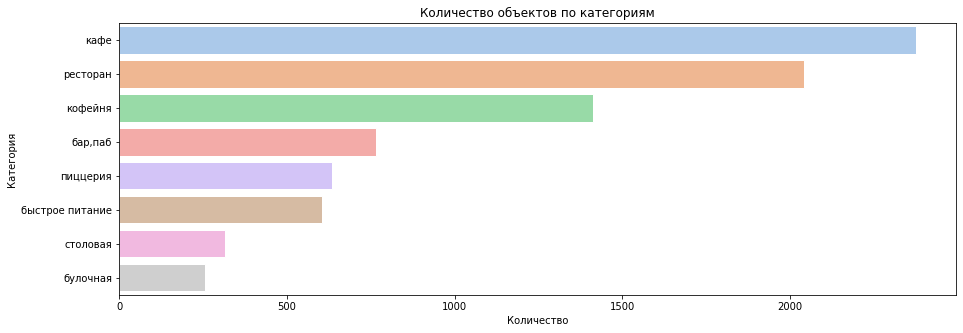

In [13]:
f, ax = plt.subplots(figsize=(15, 5))
sns.set_style("darkgrid")
sns.set_palette('pastel') 
sns.barplot(x='count', y='category', data=category_count)
plt.title('Количество объектов по категориям')
plt.xlabel('Количество')
plt.ylabel('Категория');

В Москве по количеству заведений больше всего кафе. Немного меньше ресторанов. Меньше всего столовых и булочных. 

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации и сделаем выводы

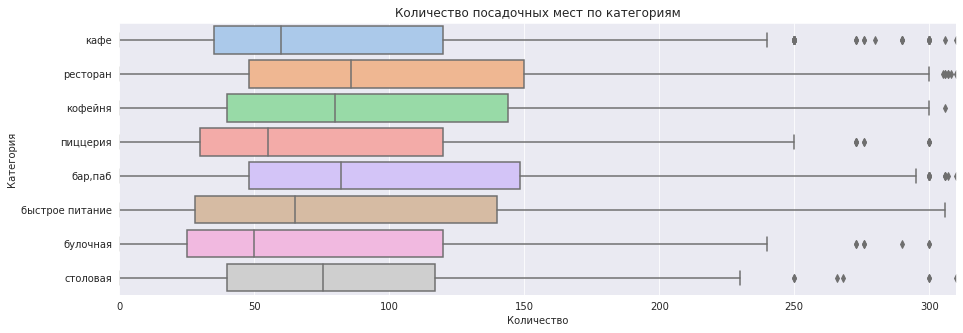

In [14]:
# уберем заведения с отсутствующими значениями в столбце seats, мы их раннее заменили на -1
df_new = df[df['seats'] != '-1.0']

f, ax = plt.subplots(figsize=(15, 5))
sns.set_color_codes('pastel')

ax = sns.boxplot(x='seats', y='category',  data=df_new)
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Количество')
plt.ylabel('Категория')
ax.set_xlim(0, 310); # приблизим график по ширине для большей наглядности;

Если не брать во внимание выбросы, то самые большие заведения Москвы имеют до 300 посадочных мест. Самыми крупными являются рестораны, бары, заведения быстрого питания и кофейни. Но если рассматривать медианы, то среднестатистически самыми крупными будут рестораны, бары, столовые и кофейни - около 75-80 мест. Самые маленькие по вместимости - булочные, медиана 50 мест, и пиццерии.

Рассмотрим соотношение сетевых и несетевых заведений в датасете и узнаем каких заведений больше?

In [15]:
ch = df.groupby(by = 'chain')['name'].count()
ch

chain
0    5199
1    3203
Name: name, dtype: int64

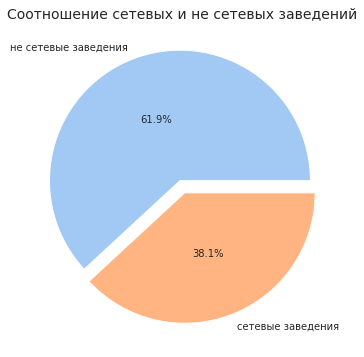

In [16]:
pie, ax = plt.subplots(figsize=[15,6])
sns.set_palette('pastel') 
labels = ['не сетевые заведения', 'сетевые заведения']
plt.pie(x=ch, autopct="%.1f%%", labels=labels, explode=[0.05]*2, pctdistance=0.5)
plt.title("Соотношение сетевых и не сетевых заведений", fontsize=14);

Большая часть заведений в Москве - не сетевые, их около 62%. Но стоит посмотреть, возможно в разных категориях расклад может быть другим. Посчитаем тоже самое, но с групировкой по категориям заведений.

In [17]:
pv = pd.pivot_table(df, values='name', index='category', columns='chain', aggfunc='count').reset_index()
pv['total'] = pv[0] + pv[1]
pv['percent_not_chain'] = round(pv[0] / pv['total'], 2)*100
pv['percent_chain'] = round(pv[1] / pv['total'], 2)*100
pv.sort_values(by='percent_chain', ascending=False)

chain,category,0,1,total,percent_not_chain,percent_chain
1,булочная,99,157,256,39.0,61.0
5,пиццерия,303,330,633,48.0,52.0
4,кофейня,693,720,1413,49.0,51.0
2,быстрое питание,371,232,603,62.0,38.0
6,ресторан,1313,729,2042,64.0,36.0
3,кафе,1597,779,2376,67.0,33.0
7,столовая,227,88,315,72.0,28.0
0,"бар,паб",596,168,764,78.0,22.0


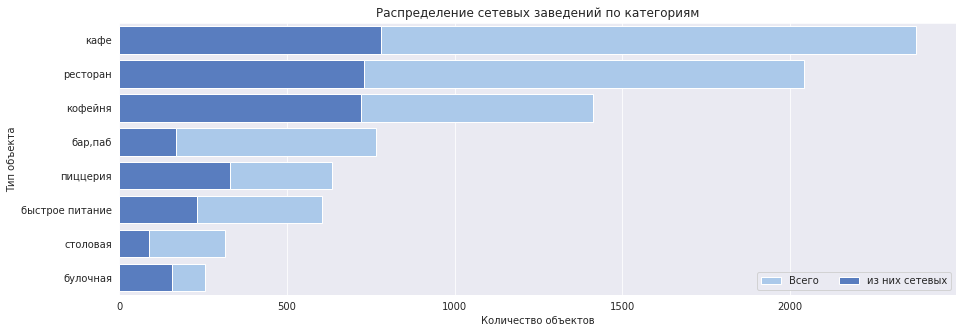

In [18]:
f, ax = plt.subplots(figsize=(15, 5))
sns.set_color_codes('pastel')
chain_type_sorted = pv.sort_values('total', ascending=False)
sns.barplot(x='total', y='category', data=chain_type_sorted,
            label='Всего', color='b', edgecolor='w')
sns.set_color_codes('muted')
sns.barplot(x=1, y='category', data=chain_type_sorted,
            label='из них сетевых', color='b', edgecolor='w')
ax.legend(ncol=2, loc='lower right')
ax.set(ylabel="Тип объекта", xlabel="Количество объектов")
plt.title('Распределение сетевых заведений по категориям')
plt.show()

Замечаем, что не сетевых заведений больше в этих категориях заведений: бар,паб, быстрое питание, кафе, ресторан, столовая  
Примерно равное соотношение у кофеен и пиццерий  
Больший процент сетевых заведений у булочных. Возможно более низкая маржинальность вынуждает их экономить за счёт масштаба сети и уменьшения части издержек. 

Сгруппируем данные по названиям заведений и найдём топ-15 популярных сетей в Москве.

In [19]:
top_chains = df[df['chain'] == 1].pivot_table(index=['name', 'category'], values='chain', aggfunc='count').sort_values(by = 'chain', ascending = False).reset_index().head(15)
top_chains

,name,category,chain
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


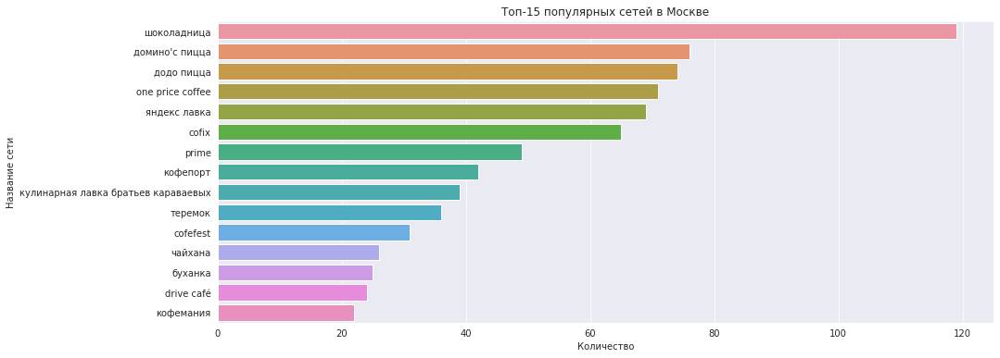

In [20]:
f, ax = plt.subplots(figsize=(15, 6))
sns.set_palette('pastel') 
sns.set_style("darkgrid")
sns.barplot(x='chain', y='name', data=top_chains)
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество')
plt.ylabel('Название сети');

Text(0.5, 1.0, 'Соотношение категорий в топ-15 сетей')

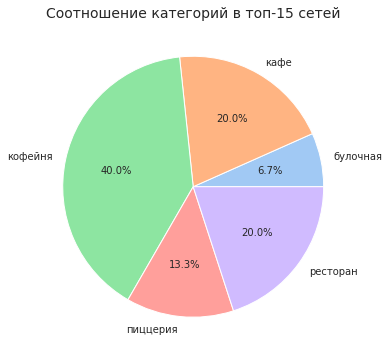

In [21]:
pie, ax = plt.subplots(figsize=[15,6])
sns.set_palette('pastel') 
labels = top_chains.groupby('category')['name'].count().index
plt.pie(x=top_chains.groupby('category')['name'].count(), autopct="%.1f%%", labels = labels)
plt.title("Соотношение категорий в топ-15 сетей", fontsize=14)



В Москве из сетевых заведений лидерами является Шоколадница, Домино'с Пицца, Додо Пицца. Это всё известные бренды, и их обьединяет не самая высокая ценовая категория, также большинство из них относятся к кофейням (40%). В такие заведения люди редко специально едут через весь город, это больше заведения локального характера, поэтому их должно быть много, чтобы обхватить большее количество клиентов.

Изучим какие административные районы Москвы присутствуют в датасете и какие заведения в каждом из них находятся.  
Посмотрим список всех административных районов и общее количество заведений в каждом их них

In [22]:
districts = df.groupby('district')['name'].count().sort_values(ascending = False).reset_index()
districts['percent'] = round(districts['name']/districts['name'].sum()*100, 1)
districts

,district,name,percent
0,Центральный административный округ,2242,26.7
1,Северный административный округ,898,10.7
2,Южный административный округ,892,10.6
3,Северо-Восточный административный округ,890,10.6
4,Западный административный округ,850,10.1
5,Восточный административный округ,798,9.5
6,Юго-Восточный административный округ,714,8.5
7,Юго-Западный административный округ,709,8.4
8,Северо-Западный административный округ,409,4.9


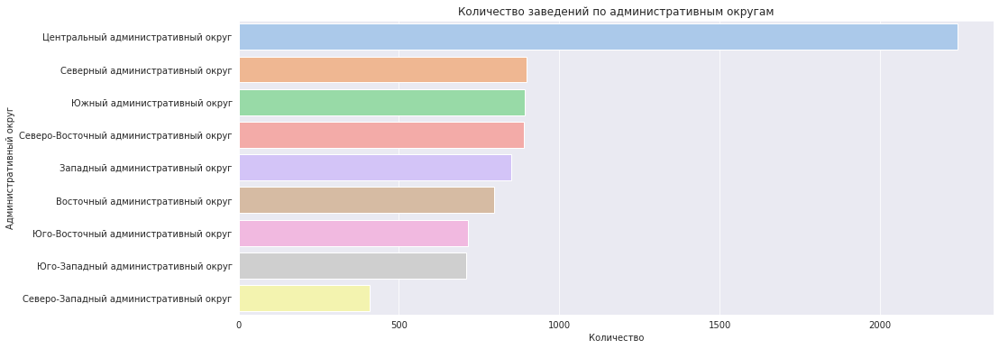

In [23]:
f, ax = plt.subplots(figsize=(15, 6))
sns.set_palette('pastel') 
sns.barplot(x='name', y='district', data=districts)
plt.title('Количество заведений по административным округам')
plt.xlabel('Количество')
plt.ylabel('Административный округ');

В датасете присутствуют все округа Москвы, кроме Зеленоградского, Троицкого и Новомосковского, а именно:
- 'Центральный административный округ',
- 'Северный административный округ'
- 'Южный административный округ'
- 'Северо-Восточный административный округ'
- 'Западный административный округ'
- 'Восточный административный округ'
- 'Юго-Восточный административный округ'
- 'Юго-Западный административный округ'
- 'Северо-Западный административный округ'

Это ещё можно назвать 'старой' Москвой.  
Самое большое количество точек общепита расположено в Центральном округе. Далее в 2,5 раза меньшее количество в Северном, Южном и Северо-Восточном округах. Самое маленькое количество точек на Северо-Западе.

Визуализируем распределение средних рейтингов по категориям заведений.

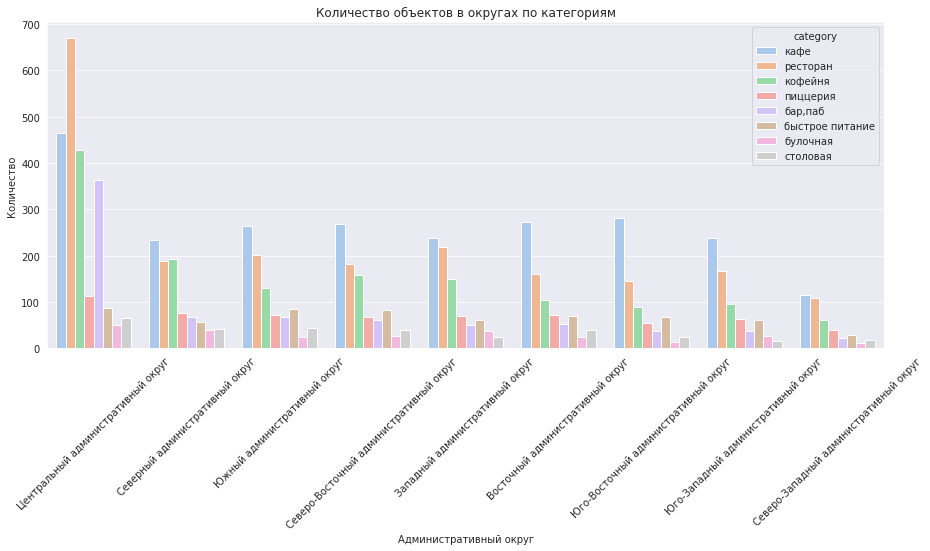

In [24]:
f, ax = plt.subplots(figsize=(15, 6))
sns.countplot(x='district', hue='category', data=df, order = districts['district'])
plt.title('Количество объектов в округах по категориям')
plt.xticks(rotation=45)
plt.xlabel('Административный округ')
plt.ylabel('Количество');

Во всех округах, кроме центрального, количество кафе превышает количество других типов общепита. Но в центральном округе преобладают рестораны. Также выделяется большое количество баров и пабов в центральном округе. А меньше всего во всех округах булочных и столовых.

Далее визуализируем распределение средних рейтингов по категориям заведений. Вопользуемся средним арифметическим, потому что здесь отсутствуют выбросы.

In [25]:
rating_df = df.groupby('category', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
rating_df

,category,rating
0,"бар,паб",4.387696
5,пиццерия,4.301264
6,ресторан,4.290402
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.124285
2,быстрое питание,4.050249


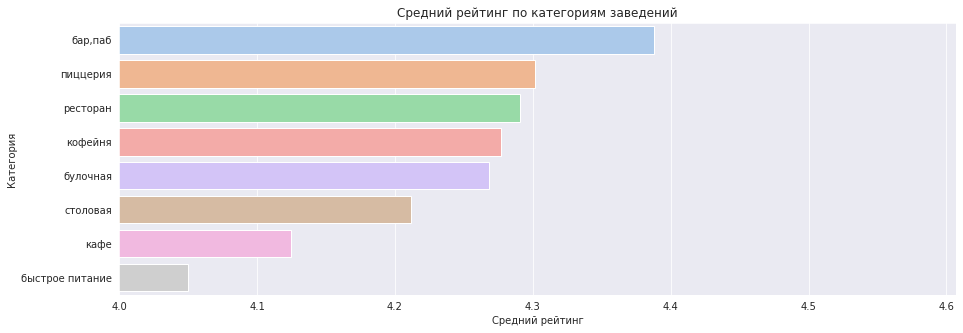

In [26]:
f, ax = plt.subplots(figsize=(15, 5))
sns.set_palette('pastel') 
sns.set_style("darkgrid")
sns.barplot(x='rating', y='category', data=rating_df)
plt.title('Средний рейтинг по категориям заведений')
plt.xlabel('Средний рейтинг')
plt.ylabel('Категория')
plt.xlim(4); # сменим масштаб оси X, чтобы разница была более наглядной;

Разброс оценок в целом не очень большой. Разница между самой рейтинговой категорией и с категорией, имеющей самый низкий средний рейтинг - чуть более 0,3. 
В среднем посетители лучше всего оценивают бары и пабы. Возможно их чаще посещают в хорошем расположении духа, а также цель таких заведений именно в приятном времяпрепровождении. Среди них много модных, популярных точек. 
Самый низкий средний рейтинг у предприятий быстрого питания. 

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [27]:
rating_distr = df.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
rating_distr

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.240980
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181647
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.147978
6,Юго-Восточный административный округ,4.101120


In [28]:
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_distr,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Можно сказать, что рейтинг распределён довольно плотно. Между округом с самыми рейтинговыми заведениями и округом с самым низким рейтингом меньше 0,3.  
Самый высокий средний рейтинг точек общепита в центральном округе Москвы. Именно здесь сосредоточены самые популярные, модные, известные заведения Москвы. За ним идёт Северный и Северо-Западный округа.  
Самый низкий средний рейтинг в Юго-Восточном округе.

Отобразим все заведения датасета на карте с помощью кластеров

In [29]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Найдём топ-15 улиц по количеству заведений. 

In [30]:
street = df.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name', ascending=False).head(15)
top15_st = street.index
street

,name
street,
проспект мира,183
профсоюзная,122
проспект вернадского,108
ленинский проспект,107
ленинградский проспект,95
дмитровское шоссе,88
каширское шоссе,77
варшавское шоссе,76
ленинградское шоссе,70


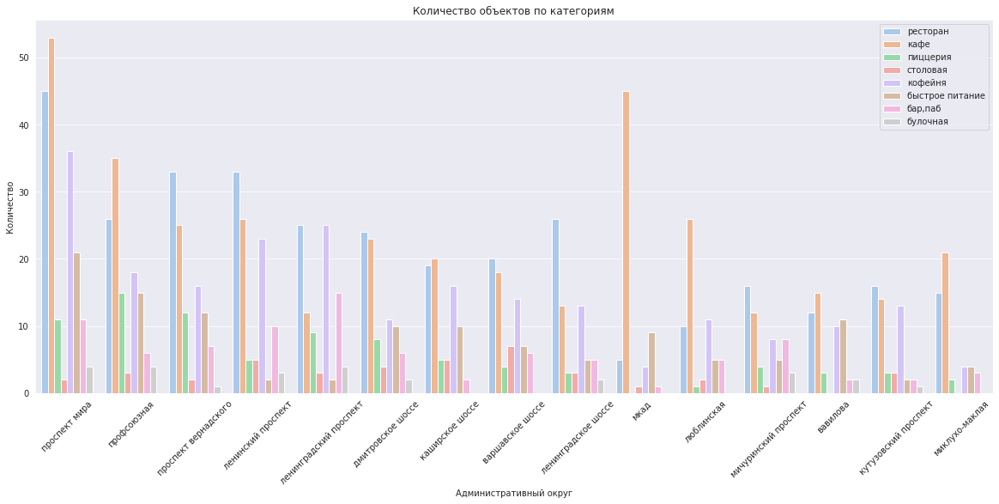

In [31]:
street = df.query('street in @top15_st')
f, ax = plt.subplots(figsize=(20, 8))
sns.countplot(x='street', hue='category', data=street, order=top15_st)
plt.title('Количество объектов по категориям')
plt.xticks(rotation=45)
plt.xlabel('Административный округ')
plt.ylabel('Количество')
plt.legend(loc='upper right');

In [32]:
print('Количество обьектов питания на улицах из топ 15:', len(street))
print('Доля от всех заведений:', round(len(street)/len(df), 2))

Количество обьектов питания на улицах из топ 15: 1266
Доля от всех заведений: 0.15


Всего на 15 улицах находится 15% всех заведений питания Москвы, а именно 1258. Это связано с тем, что эти улицы имеют большую протяжённость, кроме Пятницкой, но она, находясь в самом центре, имеет высокую туристическую привлекательность.
В целом сохраняется высокая доля кафе и ресторанов. Хочется выделить особенно большую долю кофеен на Ленинградском проспекте, а также более высокую долю кафе на МКАДе.

Найдём улицы, на которых находится только один объект общепита.

In [33]:
streets = df.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name')
street1 = streets.query('name == 1').index
one_on_street = df.query('street in @street1')
print('Количество улиц с одним объектом общепита:', len(one_on_street))


Количество улиц с одним объектом общепита: 457


In [34]:
one_on_street['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             51
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

In [35]:
one_on_street['category'].value_counts()

кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

В Москве 458 улицы, на которых располагаются по одному объекту общепита. Про них можно сказать, что большая их часть расположена в Центральном административном округе и в большинстве своём это кафе.    
В центре Москвы много маленьких улиц/переулков на которых двум объектам уже может быть 'тесно'.

Посчитаем медиану стоимости среднего чека для каждого района

In [36]:
dfn = df.query('middle_avg_bill != -1.0')
median_bill = dfn.groupby('district', as_index = False)['middle_avg_bill'].median().sort_values(by='middle_avg_bill', ascending=False)
median_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [37]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Медианный чек по районам',
).add_to(m)

# выводим карту
m

Логично видеть самый высокий медианный чек в центральном округе, т.к. здесь самая высокая стоимость аренды, большое количество туристов и более обеспеченный контингент. На уровне центра находится и западный административный округ. Здесь находится знаменитая Рублёвка с богатыми жителями и дорогими заведениями. В остальных округах стоимость ниже, но удалённость от центра влияет по разному. Северный и Северо-западный округа более дорогие, а Южный, Юго-Восточный и Северо-Восточный самые дешевые. Возможно это коррелирует со средней стоимостью аренды недвижимости в данных округах и благосостоянием жителей.  
Медианная цена среднего чека в самых дорогих Центральном и Западном округах более чем в два раза отличаются от самого дешевого Юго-Восточного. 

## Вывод

- В Москве по количеству заведений больше всего кафе. Немного меньше ресторанов. Меньше всего столовых и булочных. 
- Если не брать во внимание выбросы, то самые большие заведения Москвы имеют до 300 посадочных мест. Самыми крупными являются рестораны, бары, заведения быстрого питания и кофейни. Если рассматривать медианы, то среднестатистически самыми крупными будут рестораны, бары, столовые и кофейни - около 75-80 мест. Самые маленькие по вместимости - булочные, медиана 50 мест, и пиццерии.
- Большая часть заведений в Москве - не сетевые, их около 62%. Не сетевых заведений больше в этих категориях заведений: бар,паб, быстрое питание, кафе, ресторан, столовая, примерно равное соотношение у кофеен и пиццерий, самый большое процент сетевых заведений у булочных. Возможно более низкая маржинальность вынуждает их экономить за счёт масштаба сети и уменьшения части издержек. 
- В Москве из сетевых заведений лидерами является Шоколадница, Домино'с Пицца, Додо Пицца. Это всё известные бренды, и их обьединяет не самая высокая ценовая категория, также большинство из них относятся к кофейням (40%). В такие заведения люди редко специально едут через весь город, это больше заведения локального характера, поэтому их должно быть много, чтобы обхватить большее количество клиентов.
- В датасете присутствуют все округа Москвы, кроме Зеленоградского, Троицкого и Новомосковского, а именно:
 'Центральный административный округ',
 'Северный административный округ',
 'Южный административный округ',
 'Северо-Восточный административный округ',
 'Западный административный округ',
 'Восточный административный округ',
 'Юго-Восточный административный округ',
 'Юго-Западный административный округ',
 'Северо-Западный административный округ'.  
 Это ещё можно назвать 'старой' Москвой.   
Самое большое количество точек общепита расположено в Центральном округе. Далее в 2,5 раза меньшее количество в Северном, Южном и Северо-Восточном округах. Самое маленькое количество точек на Северо-Западе.
- Во всех округах, кроме центрального, количество кафе превышает количество других типов общепита. Но в центральном округе преобладают рестораны. Также выделяется большое количество баров и пабов в центральном округе. А меньше всего во всех округах булочных и столовых.
- Если сравнивать рейтинги заведений у разных категорий общемита, то можно заметить, что разброс оценок в целом не очень большой. Разница между самой рейтинговой категорией и с категорией, имеющей самый низкий средний рейтинг - чуть более 0,3. 
В среднем посетители лучше всего оценивают бары и пабы. Возможно их чаще посещают в хорошем расположении духа, а также цель таких заведений именно в приятном времяпрепровождении. Среди них много модных, популярных точек. 
Самый низкий средний рейтинг у предприятий быстрого питания. 
- По географическому принципу рейтинг распределён довольно плотно. Между округом с самыми рейтинговыми заведениями и округом с самым низким рейтингом меньше 0,3. Самый высокий средний рейтинг точек общепита в центральном округе Москвы. Именно здесь сосредоточены самые популярные, модные, известные заведения Москвы. За ним идёт Северный и Северо-Западный округа. Самый низкий средний рейтинг в Юго-Восточном округе.
- Был обнаружен интересный факт: на 15 улицах находится 15% всех заведений питания Москвы, а именно 1258. Это связано с тем, что эти улицы имеют большую протяжённость, кроме Пятницкой, но она, находясь в самом центре, имеет высокую туристическую привлекательность. Улицы с самым большим количеством точек общепита: 'проспект Мира', 'Профсоюзная', 'проспект Вернадского', 'Ленинский проспект', 'Ленинградский проспект', 'Дмитровское шоссе', 'Каширское шоссе', 'Варшавское шоссе', 'Ленинградское шоссе', 'МКАД', 'Люблинская', 'Вавилова', 'Кутузовский проспект', 'Миклухо-Маклая', 'Пятницкая'.  
В целом сохраняется высокая доля кафе и ресторанов. Хочется выделить особенно большую долю кофеен на Ленинградском проспекте, а также более высокую долю кафе на МКАДе.
- В Москве 458 улицы, на которых располагаются по одному объекту общепита. Про них можно сказать, что большая их часть расположена в Центральном административном округе и в большинстве своём это кафе.    
В центре Москвы много маленьких улиц/переулков на которых двум объектам уже может быть 'тесно'.
- Логично видим самый высокий медианный чек в центральном округе, т.к. здесь самая высокая стоимость аренды, большое количество туристов и более обеспеченный контингент. На уровне центра находится и западный административный округ. Здесь находится знаменитая Рублёвка с богатыми жителями и дорогими заведениями. В остальных округах стоимость ниже, но удалённость от центра влияет по разному. Северный и Северо-западный округа более дорогие, а Южный, Юго-Восточный и Северо-Восточный самые дешевые. Возможно это коррелирует со средней стоимостью аренды недвижимости в данных округах и благосостоянием жителей.  
Медианная цена среднего чека в самых дорогих Центральном и Западном округах более чем в два раза отличаются от самого дешевого Юго-Восточного. 

## Открытие кофейни

Приступим к детализации исследования, рассмотрим рынок кофеен. В ходе исследования ответим на ключевые вопросы о часах работы кофеен, о рейтингах, о ценовой политике и прочие важные для принятия решения вопросы.
Для начала проверим сколько кофеен в Москве, и в каких районах они расположены

In [38]:
df_coffee = df.query('category == "кофейня"') # сделаем срез с кофейнями 

In [39]:
print('Количество кофеен в датасете:', df.query('category == "кофейня"')['name'].count())

Количество кофеен в датасете: 1413


In [40]:
coffee = df_coffee.groupby('district', as_index = False)['name'].count().sort_values(by='name', ascending=False)
coffee['percent_of_total'] = round(coffee['name']/coffee['name'].sum()*100,1)
coffee.columns = ['district', 'coffee_count', 'coffee_percent']
coffee

,district,coffee_count,coffee_percent
5,Центральный административный округ,428,30.3
2,Северный административный округ,193,13.7
3,Северо-Восточный административный округ,159,11.3
1,Западный административный округ,150,10.6
8,Южный административный округ,131,9.3
0,Восточный административный округ,105,7.4
7,Юго-Западный административный округ,96,6.8
6,Юго-Восточный административный округ,89,6.3
4,Северо-Западный административный округ,62,4.4


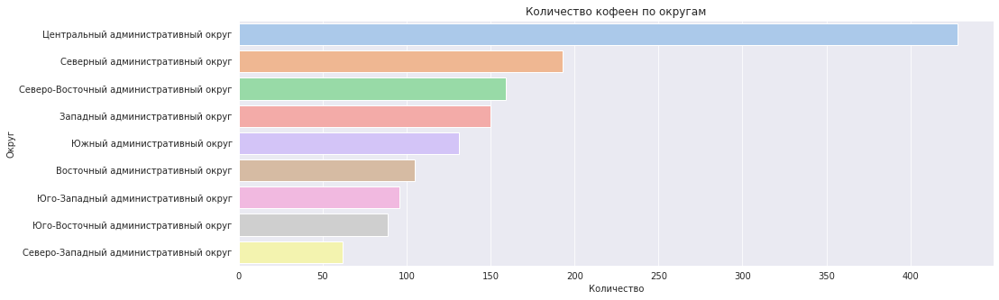

In [41]:
f, ax = plt.subplots(figsize=(15, 5))
sns.set_style("darkgrid")
sns.set_palette('pastel') 
sns.barplot(x='coffee_count', y='district', data=coffee)
plt.title('Количество кофеен по округам')
plt.xlabel('Количество')
plt.ylabel('Округ');

Большинство кофеен, 30% от всего количества, расположены в Центральном административном округе. Это может быть связано с большим количеством офисов, а именно сотрудники офисов и прогуливающиеся туристы - основной их контингент. Далее идёт Северный округ, где 13,7 процентов всех кофеен и Северо-Восточный - 11,3%.
В целом распределение кофеен практически повторяет распределение всех точек общепита по округам Москвы. Можно взглянуть на процент кофеен по округам от общего числа точек общепита. Добавим данные по точкам по округам, мы считали их раннее в исследовании и выведем столбец coffee_percent_total.

In [42]:
coffee = coffee.merge(districts, how = 'left', left_on='district', right_on='district')
coffee['coffee_percent_total'] = round(coffee['coffee_count']/coffee['name']*100,1)
coffee[['district', 'coffee_count', 'coffee_percent', 'coffee_percent_total']]

,district,coffee_count,coffee_percent,coffee_percent_total
0,Центральный административный округ,428,30.3,19.1
1,Северный административный округ,193,13.7,21.5
2,Северо-Восточный административный округ,159,11.3,17.9
3,Западный административный округ,150,10.6,17.6
4,Южный административный округ,131,9.3,14.7
5,Восточный административный округ,105,7.4,13.2
6,Юго-Западный административный округ,96,6.8,13.5
7,Юго-Восточный административный округ,89,6.3,12.5
8,Северо-Западный административный округ,62,4.4,15.2


Самая большая плотность кофеен в Северном округе - 21% от всех точек общепита - это кофейни, чуть ниже в Центральном - 19%. Самый низкий процент в Юго-Восточном округе - 12,5.
Посмотрим ещё на улицы в Москве с самым большим количеством кофеен:

In [43]:
coffee_street = df_coffee.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name', ascending=False).head(15)
top15_cf_st = coffee_street.index
coffee_street

,name
street,
проспект мира,36
ленинградский проспект,25
ленинский проспект,23
профсоюзная,18
каширское шоссе,16
проспект вернадского,16
варшавское шоссе,14
новослободская,13
ленинградское шоссе,13


Самая кофейная улица Москвы - это проспект Мира, там их 36 шт. Но и длина его большая, почти 9 км. То же самое можно сказать, про остальные улицы - все они крупные, с большой протяженностью. Интересными исключениями выглядят маленькие Новодмитровская улица и Береговой проезд.  Длина первой - всего 600 метров, на них приходится 12 кофеен и возможно это улица с самой большой плотностью кофеен в Москве. 

In [44]:
is24 = df_coffee.groupby(by = 'is_24_7')['name'].count()
is24

is_24_7
False    1354
True       59
Name: name, dtype: int64

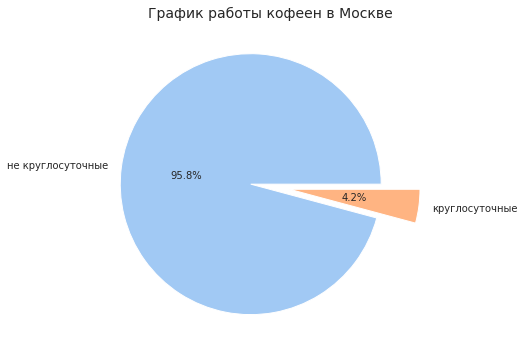

In [45]:
pie, ax = plt.subplots(figsize=[15,6])
sns.set_palette('pastel') 
labels = ['не круглосуточные', 'круглосуточные']
plt.pie(x=is24, autopct="%.1f%%", labels=labels, explode=[0.15]*2, pctdistance=0.5)
plt.title("График работы кофеен в Москве", fontsize=14);

Всего в Москве 59 круглосуточных кофеен, что составляет 4,2% от всех кофеен города, что может быть потенциальной возможностью для открытия круглосуточной кофейни, особенно в центре города.

Посмотрим на средний рейтинг кофеен по округам Москвы

In [46]:
rating_coffee = df_coffee.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
rating_coffee

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [47]:
# создаём карту Москвы
m_coffe = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m_coffe)

# выводим карту
m_coffe

Рейтинг кофеен по округам Москвы не сильно различается, в целом везде он достаточно высокий. Но самые высокие оценки получают кофейни Центрального округа и Северо-Западного, чуть меньше средний балл в Северном округе. Неожиданно самый низкий средний рейтинг у кофеен Западного округа. Может быть потому что там клиенты чуть более требовательные.  

На какую стоимость чашки капучино стоит ориентироваться при открытии? 

In [48]:
coffe_price = df_coffee.query('middle_coffee_cup != -1.0').groupby('district', as_index=False)['middle_coffee_cup'].agg('median').sort_values(by='middle_coffee_cup', ascending=False)
coffe_price

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [49]:
price_m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=coffe_price,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя цена чашки капучино по округам',
).add_to(price_m)

price_m

Стоимость чашки капучино зависит от итогового решения инвесторов в каком районе они её откроют. Можно ориентироваться на таблицу со средней стоимостью чашки в каждом из районов города. Самая низкая цена в Восточном округе - 135 р., самая высокая в Юго-Западном - 198 р. 

Юго-Западный округ пока выглядит очень перспективно, почему - поясним в конце, а пока проверим ещё одну вещь.   
Раннее в исследовании мы изучали улицы лишь с одним заведением общепита. Посмотрим на такие улицы в Юго-Западном округе и уточним срез только по кофейням

In [50]:
one_on_street.query('district == "Юго-Западный административный округ" and category == "кофейня"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
5891,foodmoscowcoffee,кофейня,"москва, ленинский проспект (дублёр)",Юго-Западный административный округ,"ежедневно, круглосуточно",55.703333,37.573414,4.1,NaN,NaN,NaN,NaN,0,NaN,ленинский проспект (дублёр),True
6265,cofefest,кофейня,"москва, улица ремизова, 6",Юго-Западный административный округ,пн-пт 08:00–19:00,55.677651,37.597738,4.0,NaN,NaN,NaN,NaN,1,NaN,ремизова,False
6847,jeffrey's coffee,кофейня,"москва, ул. профсоюзная, д.104",Юго-Западный административный округ,unknown,55.641920,37.523465,4.7,NaN,NaN,NaN,NaN,1,NaN,ул. профсоюзная,False
8400,практика кофе,кофейня,"москва, чонгарский бульвар, 26а, корп. 1",Юго-Западный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.654289,37.600722,4.4,NaN,NaN,NaN,NaN,0,55.0,чонгарский бульвар,False


Первая кофейня находится на дублёре Ленинского проспекта, это по сути тот же Ленинский проспект, на котором достаточно много обьектов поэтому посчитаем, что это нам не подходит.   
Вторая улица - Ремизова. Это улица длиной более 1 км, всего с одной кофейней, с не самым высоким рейтингом и не круглосуточным графиком работы. 
Третья - ул. Профсоюзная. Мы нашли неявный дубликат. На Профсоюзной улице уже много кофеен, нам это тоже не подходит.
Чонгарский бульвар - тоже хороший вариант. Его длина также более километра, на котором одна некруглосуточная кофейня. 

Вывод

Всего в Москве 1413 кофеен.
Большинство кофеен, 30% от всего количества, расположены в Центральном административном округе. Это может быть связано с большим количеством офисов, а именно сотрудники офисов и прогуливающиеся туристы - основной их контингент. Далее идёт Северный округ, где 13,7 процентов всех кофеен и Северо-Восточный - 11,3%. В целом распределение кофеен практически повторяет распределение всех точек общепита по округам Москвы.   
Самая большая доля кофеен в Северном округе - 21% от всех точек общепита - это кофейни, чуть ниже в Центральном - 19%. Самый низкий процент в Юго-Восточном округе - 12,5.  
Самая кофейная улица Москвы - это проспект Мира, там их 36 шт. Но и длина его большая, почти 9 км. То же самое можно сказать, про остальные улицы - все они крупные, с большой протяженностью. Интересными исключениями выглядят маленькие Новодмитровская улица и Береговой проезд.  Длина первой - всего 600 метров, на них приходится 12 кофеен и возможно это улица с самой большой плотностью кофеен в Москве.  
Всего в Москве 59 круглосуточных кофеен, что составляет 4,2% от всех кофеен города, что может быть потенциальной возможностью для открытия круглосуточной кофейни, особенно в центре города.  
Рейтинг кофеен по округам Москвы не сильно различается, в целом везде он достаточно высокий. Но самые высокие оценки получают кофейни Центрального округа и Северо-Западного, чуть меньше средний балл в Северном округе. Неожиданно самый низкий средний рейтинг у кофеен Западного округа. Может быть потому что там клиенты чуть более требовательные к качеству кофе.    
Стоимость чашки капучино зависит от итогового решения инвесторов в каком районе они её откроют. Можно ориентироваться на таблицу со средней стоимостью чашки в каждом из районов города. Самая низкая цена в Восточном округе - 135 р., самая высокая в Юго-Западном - 198 р. 

## Рекомендации по открытию кофейни

Я могу предложить два подхода к открытию кофейни в своих рекомендациях.  

Первый подход в том, что рынок всегда прав, и если где-то чего-то много, то это популярно. Можно порекомендовать открыть кофейню в Центральном округе, ведь там уже много кофеен, много офисных сотрудников, всегда много отдыхающих местных жителей и гостей города. В центре высокий средний рейтинг кофеен, высокий уровень доверия к этой сфере среди клиентов, высокая средняя стоимость чашки капучино, а значит и более высокий средний чек. График сделать не круглосуточный, ведь владельцы большинства кофеен уже определили, что это для них не выгодно. Из минусов этого подхода можно выделить высокий уровень конкуренции и как следствие сложность создания уникального продукта не как у всех, почему клиенты должны пойти в новую кофейню, а не в соседнюю.   

Второй подход предусматривает поиск точек роста, потенциальных возможностей, которыми можно воспользоваться. 
Например рассмотрим Юго-Западный округ. Здесь лишь 13.5% от всех точек общепита - это кофейни. Для сравнения в Центральном округе более 19 %. Здесь общее количество кофеен более чем в 4 раза меньше, чем в центре, лишь 96. Здесь самая высокая в Москве средняя стоимость одной чашки капучино, что косвенно может говорить о низкой конкуренции и нехватке заведений этого типа, большое количество университетов и студентов, которым не по карману местные цены на кофе, что означает, что нужно делать приемлимыми цены или интересную бонусную систему и тогда они будут счастливы принести деньги в более доступную, современную, стильную кофейню, похожую на «Central Perk» из всеми любимого сериала Друзья. Юго-Западный округ лишь на 4ом месте по среднему рейтингу, а это значит, что посетителей не всем устраивают нынешние кофейни и можно попытаться им угодить. Можно подумать и о круглосуточной работе кофейни, ведь таких заведений в Москве крайне мало и это бы стало ещё одной её отличительной особенностью. А студенты, как известно, имеют больше чем 24 часа в сутках =) И даже если инвесторы не боятся конкуренции Центра, то я бы посоветовал пойти именно этим путём, чтобы иметь гораздо больше возможностей для потенциального роста. 
Из более конкретного расположения можно рассмотреть Чонгарский бульвар или улицу Ремизова. И там и там лишь одна кофейня, причём на улице Ремизова не самая лучшая, судя по рейтингу. Обе они не круглосуточные, что даст нам преимущество при выборе данного графика работы, но нужно тщательно изучить потенциального клиента. 

## Презентация
Ссылка на презентацию:
https://disk.yandex.ru/i/dpW-dYAtNetjWg